In [1]:
import pandas as pd
import plotly.express as px
from copy import copy
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import plotly.figure_factory as ff
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from tensorflow import keras
import os

In [2]:
#ignore warning
import warnings
warnings.filterwarnings('ignore')

In [3]:
%run Connect_Database.ipynb

Enter database password········
('INTC', 17.0, 4.0, 6.0, 7.0, datetime.datetime(2022, 2, 1, 0, 0), 'LAG_PERF', 'Semiconductors', 3.0, 31, 14.57, 'Customer Incidents,Business Ethics Incidents', 11.6, 21.21967741935484, 32.93, 2.53, 8.044999999999998, 16.08, 2.62, 6.166333333333333, 9.51, 4.79, 6.668666666666666, 9.67, 0.0, 1.1290322580645162, 4.0, 'None')


In [4]:
esg_info_df

,Ticker,totalScore,eScore,sScore,gScore,lastRated,esgPerformance,peerGroup,highestControversy,peerCount,...,bookValue,returnOnAssets,returnOnEquity,averageVolume,volume,currentPrice,fiftyTwoWeekLow,fiftyTwoWeekHigh,regularMarketPrice,marketCap
0,INTC,17.0,4.0,6.0,7.0,2022-02-01,LAG_PERF,Semiconductors,3.0,31,...,22.151,0.08586,0.22522,39784168,33249492,51.8300,43.63,68.49,51.8300,210792628224
1,MSFT,13.0,0.0,8.0,5.0,2022-02-01,LAG_PERF,Software & Services,3.0,105,...,21.335,0.15249,0.49051,37807347,14327104,307.1974,231.10,349.67,307.1974,2306201616384
2,BAC,27.0,2.0,14.0,11.0,2022-02-01,Not Available,Banks,3.0,175,...,30.374,0.01068,0.11778,55160016,19239484,43.0200,36.51,50.11,43.0200,346950303744
3,AAPL,16.3,0.6,6.9,8.8,2022-02-01,UNDER_PERF,Technology Hardware,3.0,55,...,4.402,0.19875,1.45567,93700745,51356493,174.2850,118.86,182.94,174.2900,2844308013056
4,NVDA,12.8,2.5,4.1,6.1,2022-02-01,UNDER_PERF,Semiconductors,2.0,31,...,10.619,0.17199,0.44832,52434636,24961081,276.8399,127.00,346.47,276.8399,689885020160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,DLR,13.0,3.2,3.7,6.1,2022-02-01,UNDER_PERF,Real Estate,0.0,108,...,58.279,0.01308,0.09442,1634014,819189,138.2300,130.10,178.22,138.2300,39227875328
61,COF,23.2,0.1,13.5,9.7,2022-02-01,AVG_PERF,Diversified Financials,4.0,89,...,133.911,0.02959,0.20556,3024740,2240666,135.8800,122.43,177.95,135.8800,57833521152
62,BBY,14.3,2.2,7.3,4.8,2022-02-01,UNDER_PERF,Retailing,2.0,57,...,17.547,0.10162,0.63223,3214070,1679729,96.3000,85.58,141.97,96.3000,23166023680
63,KMB,22.2,8.1,7.8,6.4,2022-02-01,AVG_PERF,Household Products,2.0,28,...,1.526,0.10050,2.29639,2023524,1778481,120.2800,117.32,145.79,120.2800,40525701120


In [5]:
business_controversy_df

,Ticker,animalTesting,catholicValues,controversialWeapons,militaryContracting,None,Nuclear,smallArms,thermalCoal
0,INTC,0,0,0,0,1,0,0,0
1,MSFT,0,0,0,0,1,0,0,0
2,BAC,0,0,0,0,1,0,0,0
3,AAPL,0,0,0,0,1,0,0,0
4,NVDA,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...
60,DLR,0,0,0,0,1,0,0,0
61,COF,0,0,0,0,1,0,0,0
62,BBY,0,0,0,0,1,0,0,0
63,KMB,1,0,0,0,0,0,0,0


In [6]:
controversy_df

,Ticker,businessEthicsIncidents,customerIncidents,employeeIncidents,environmentalSupplyChainIncidents,governanceIncidents,None,operationsIncidents,productServiceIncidents,publicPolicyIncidents,socialSupplyChainIncidents,societyCommunityIncidents
0,INTC,1,1,0,0,0,0,0,0,0,0,0
1,MSFT,0,1,0,0,0,0,0,0,0,0,0
2,BAC,1,1,0,0,0,0,0,0,0,0,1
3,AAPL,1,1,0,0,0,0,0,0,0,1,0
4,NVDA,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
60,DLR,0,0,0,0,0,1,0,0,0,0,0
61,COF,0,1,0,0,0,0,0,0,0,0,0
62,BBY,1,1,1,1,0,0,0,0,0,1,0
63,KMB,0,1,0,0,0,0,0,0,0,1,0


In [7]:
stocks_df

,Ticker,Date,Open,High,Low,Close,Adj Close,Volume
0,INTC,2018-03-16,51.169998,51.700001,50.990002,51.169998,47.260136,42559800.0
1,INTC,2018-03-19,50.740002,51.230000,49.930000,50.830002,46.946121,31115200.0
2,INTC,2018-03-20,50.880001,51.810001,50.849998,51.549999,47.611103,22215000.0
3,INTC,2018-03-21,51.549999,52.169998,51.169998,51.560001,47.620346,23239500.0
4,INTC,2018-03-22,50.740002,51.959999,50.599998,50.830002,46.946121,30916000.0
...,...,...,...,...,...,...,...,...
64443,EMN,2022-03-09,107.809998,109.629997,107.349998,108.709999,107.926285,2445400.0
64444,EMN,2022-03-10,107.580002,107.889999,105.760002,106.889999,106.119400,1750700.0
64445,EMN,2022-03-11,107.440002,107.660004,105.389999,105.419998,104.660004,1610800.0
64446,EMN,2022-03-14,105.839996,107.209999,104.370003,106.080002,106.080002,1504800.0


In [11]:
# Got the closing price for all stocks
def create_df(df, index, column, value):
    stocks_df = df.copy()
    stocks_df = stocks_df.pivot(index=index, columns=column, values=value)
    stocks_df = stocks_df.reset_index()
    stocks_df['Date'] = pd.to_datetime(stocks_df['Date'])
    stocks_df = stocks_df.sort_values(by = ['Date'])
    return stocks_df

In [13]:
# Get price of stocks, sorted by date
stock_price_df = create_df(stocks_df, 'Date', 'Ticker', 'Close')
stock_price_df

Ticker,Date,AAPL,ABT,ACN,ADM,AEP,AES,AMAT,AMGN,ANTM,...,PG,QCOM,RF,SPGI,SYF,T,UNH,UPS,VZ,WFC
0,2018-03-16,44.505001,63.180000,160.889999,43.500000,67.809998,10.840000,59.439999,188.240005,228.110001,...,78.970001,60.619999,19.629999,192.509995,35.200001,37.000000,227.860001,110.910004,48.560001,55.900002
1,2018-03-19,43.825001,62.259998,160.619995,43.060001,67.449997,10.770000,58.500000,182.550003,227.990005,...,78.660004,58.369999,19.549999,190.449997,35.259998,36.580002,225.050003,108.459999,48.310001,55.480000
2,2018-03-20,43.810001,62.650002,162.880005,42.970001,67.449997,10.710000,59.230000,182.029999,229.979996,...,78.309998,58.259998,19.459999,195.649994,35.400002,36.340000,226.779999,108.029999,47.689999,54.900002
3,2018-03-21,42.817501,62.419998,162.029999,42.619999,66.910004,10.800000,60.779999,181.589996,225.990005,...,77.040001,56.810001,19.530001,193.809998,35.299999,36.000000,222.820007,107.650002,47.279999,54.790001
4,2018-03-22,42.212502,60.930000,150.229996,41.939999,67.360001,10.820000,58.959999,176.080002,218.850006,...,76.410004,55.580002,18.620001,189.080002,33.730000,35.369999,215.210007,104.449997,46.880001,52.529999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1002,2022-03-09,162.949997,118.389999,309.420013,81.779999,95.010002,21.959999,128.619995,231.460007,465.369995,...,148.770004,157.110001,22.450001,391.510010,36.200001,23.260000,485.570007,206.779999,53.080002,49.160000
1003,2022-03-10,158.520004,117.000000,309.519989,84.309998,95.989998,22.350000,124.970001,226.949997,473.200012,...,144.940002,154.710007,22.000000,382.750000,35.430000,23.190001,491.440002,207.179993,53.230000,49.009998
1004,2022-03-11,154.729996,114.019997,311.579987,83.599998,95.540001,22.200001,123.639999,228.850006,465.260010,...,143.220001,152.339996,21.910000,379.679993,35.040001,23.190001,482.869995,203.899994,53.040001,48.470001
1005,2022-03-14,150.619995,115.519997,307.679993,82.570000,94.739998,21.719999,120.129997,229.210007,458.329987,...,145.050003,141.289993,22.719999,377.000000,35.480000,22.889999,487.920013,204.300003,52.500000,49.860001


In [15]:
# Get volume of stocks, sorted by date
stock_vol_df = create_df(stocks_df, 'Date', 'Ticker', 'Volume')
stock_vol_df

Ticker,Date,AAPL,ABT,ACN,ADM,AEP,AES,AMAT,AMGN,ANTM,...,PG,QCOM,RF,SPGI,SYF,T,UNH,UPS,VZ,WFC
0,2018-03-16,157618800.0,11840900.0,4018600.0,10091100.0,6399400.0,7325800.0,15070200.0,16878400.0,1834700.0,...,17715400.0,25574500.0,22955400.0,1836600.0,13767800.0,37103000.0,5690300.0,5679200.0,26838100.0,37095000.0
1,2018-03-19,133787200.0,5286200.0,1890000.0,4270500.0,2595600.0,5646600.0,13747300.0,3970400.0,1088800.0,...,8368200.0,14131400.0,10701000.0,1160400.0,7071400.0,19637900.0,3407300.0,3351200.0,12980800.0,17982200.0
2,2018-03-20,78597600.0,3943000.0,2249400.0,2133700.0,2496400.0,6359700.0,8527300.0,2582200.0,1326100.0,...,8465500.0,10615400.0,10213200.0,1289500.0,4799800.0,20167100.0,3429100.0,2513000.0,10765500.0,26874600.0
3,2018-03-21,148219600.0,3478300.0,3452600.0,3078300.0,2805300.0,5687900.0,17171400.0,2531100.0,1316300.0,...,9822800.0,12231900.0,6715800.0,1471800.0,4325100.0,17437200.0,3419800.0,2805100.0,11062500.0,18997300.0
4,2018-03-22,165963200.0,5345300.0,8203600.0,2645500.0,3137500.0,7888900.0,14876400.0,3553000.0,1571900.0,...,10481600.0,13554600.0,12313200.0,1293200.0,5728000.0,28196900.0,5894800.0,4150000.0,14270800.0,32656300.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1002,2022-03-09,91454900.0,5004700.0,2825900.0,5769900.0,3006200.0,6540500.0,7623200.0,2640900.0,1168300.0,...,7044100.0,9276800.0,10750000.0,3034100.0,7234900.0,43814900.0,3115500.0,3097600.0,23049800.0,34560200.0
1003,2022-03-10,105342000.0,4377600.0,2049000.0,3395900.0,2897900.0,3953100.0,5604400.0,3957200.0,1243000.0,...,9221000.0,8888800.0,8808200.0,2767300.0,7169200.0,40500800.0,2834800.0,2284100.0,17501800.0,26178800.0
1004,2022-03-11,96836300.0,8012400.0,3811900.0,3016900.0,2254900.0,4679500.0,6013200.0,2667000.0,1074500.0,...,7085800.0,7392100.0,8355500.0,2252100.0,5767400.0,54451800.0,2615000.0,2006200.0,20834600.0,23695900.0
1005,2022-03-14,108732100.0,5527500.0,3156600.0,3647200.0,2948400.0,5516900.0,6733200.0,2902700.0,1427800.0,...,7964600.0,16154200.0,10280300.0,2558100.0,7635800.0,49609800.0,2704100.0,2237200.0,23124100.0,28166600.0


In [16]:
# Check if Null values exist in stock prices data
stock_price_df.isnull().sum()

Ticker
Date    0
AAPL    0
ABT     0
ACN     0
ADM     0
       ..
T       0
UNH     0
UPS     0
VZ      0
WFC     0
Length: 65, dtype: int64

In [17]:
# Check if Null values exist in stocks volume data
stock_vol_df.isnull().sum()

Ticker
Date    0
AAPL    0
ABT     0
ACN     0
ADM     0
       ..
T       0
UNH     0
UPS     0
VZ      0
WFC     0
Length: 65, dtype: int64

In [18]:
# Get stock prices dataframe info
stock_price_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1007 entries, 0 to 1006
Data columns (total 65 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1007 non-null   datetime64[ns]
 1   AAPL    1007 non-null   float64       
 2   ABT     1007 non-null   float64       
 3   ACN     1007 non-null   float64       
 4   ADM     1007 non-null   float64       
 5   AEP     1007 non-null   float64       
 6   AES     1007 non-null   float64       
 7   AMAT    1007 non-null   float64       
 8   AMGN    1007 non-null   float64       
 9   ANTM    1007 non-null   float64       
 10  AXP     1007 non-null   float64       
 11  BBY     1007 non-null   float64       
 12  BDX     1007 non-null   float64       
 13  BLK     1007 non-null   float64       
 14  C       1007 non-null   float64       
 15  CI      1007 non-null   float64       
 16  CL      1007 non-null   float64       
 17  CLX     1007 non-null   float64       
 18  COF     

In [19]:
# Get stock volume dataframe info
stock_vol_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1007 entries, 0 to 1006
Data columns (total 65 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1007 non-null   datetime64[ns]
 1   AAPL    1007 non-null   float64       
 2   ABT     1007 non-null   float64       
 3   ACN     1007 non-null   float64       
 4   ADM     1007 non-null   float64       
 5   AEP     1007 non-null   float64       
 6   AES     1007 non-null   float64       
 7   AMAT    1007 non-null   float64       
 8   AMGN    1007 non-null   float64       
 9   ANTM    1007 non-null   float64       
 10  AXP     1007 non-null   float64       
 11  BBY     1007 non-null   float64       
 12  BDX     1007 non-null   float64       
 13  BLK     1007 non-null   float64       
 14  C       1007 non-null   float64       
 15  CI      1007 non-null   float64       
 16  CL      1007 non-null   float64       
 17  CLX     1007 non-null   float64       
 18  COF     

In [20]:
# Statistical desctiption of stocks volume
stock_vol_df.describe()

Ticker,AAPL,ABT,ACN,ADM,AEP,AES,AMAT,AMGN,ANTM,AXP,...,PG,QCOM,RF,SPGI,SYF,T,UNH,UPS,VZ,WFC
count,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03,...,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03,1.007000e+03
mean,1.212976e+08,5.840448e+06,2.139810e+06,3.132424e+06,2.809215e+06,5.869969e+06,9.422596e+06,2.827744e+06,1.419159e+06,3.963367e+06,...,8.137602e+06,1.124976e+07,1.047984e+07,1.376994e+06,6.121506e+06,3.883083e+07,3.641170e+06,3.459490e+06,1.628516e+07,2.851028e+07
std,5.689916e+07,3.110829e+06,9.318082e+05,1.362099e+06,1.300774e+06,2.316542e+06,4.411325e+06,1.292352e+06,7.078956e+05,2.015011e+06,...,3.453056e+06,8.192157e+06,4.566209e+06,7.454552e+05,3.651345e+06,1.982001e+07,2.071274e+06,1.998522e+06,6.758625e+06,1.464035e+07
min,4.100000e+07,1.067700e+06,5.281000e+05,4.116000e+05,4.401000e+05,9.862000e+05,1.409200e+06,6.128000e+05,2.245000e+05,7.070000e+05,...,2.022100e+06,2.120200e+06,2.588200e+06,3.630000e+05,8.444000e+05,8.697200e+06,7.140000e+05,8.359000e+05,5.763700e+06,4.635500e+06
25%,8.358420e+07,4.105850e+06,1.567750e+06,2.242350e+06,2.083450e+06,4.219500e+06,6.432100e+06,2.086100e+06,9.778500e+05,2.704050e+06,...,6.023050e+06,7.199550e+06,7.528500e+06,9.229000e+05,4.170500e+06,2.708660e+07,2.516100e+06,2.372300e+06,1.190225e+07,1.819330e+07
50%,1.064352e+08,5.130300e+06,1.932600e+06,2.780800e+06,2.532000e+06,5.518400e+06,8.413900e+06,2.548900e+06,1.247200e+06,3.380900e+06,...,7.334900e+06,9.471700e+06,9.464600e+06,1.207800e+06,5.271100e+06,3.381840e+07,3.094300e+06,2.943100e+06,1.482170e+07,2.386540e+07
75%,1.426222e+08,6.568200e+06,2.395450e+06,3.661050e+06,3.211800e+06,7.041050e+06,1.128855e+07,3.184000e+06,1.647050e+06,4.533550e+06,...,9.186750e+06,1.278855e+07,1.236490e+07,1.613200e+06,7.119800e+06,4.431680e+07,4.162050e+06,3.925850e+06,1.863140e+07,3.493305e+07
max,4.265100e+08,4.754020e+07,8.561500e+06,1.136810e+07,2.245570e+07,2.101100e+07,5.258420e+07,1.687840e+07,7.352000e+06,1.726170e+07,...,3.309570e+07,1.560193e+08,5.115560e+07,9.770400e+06,6.933200e+07,2.470524e+08,2.736140e+07,3.097090e+07,5.540630e+07,1.189526e+08


In [21]:
# Statistical desctiption of stocks price
stock_price_df.describe()

Ticker,AAPL,ABT,ACN,ADM,AEP,AES,AMAT,AMGN,ANTM,AXP,...,PG,QCOM,RF,SPGI,SYF,T,UNH,UPS,VZ,WFC
count,1007.000000,1007.000000,1007.000000,1007.000000,1007.000000,1007.000000,1007.000000,1007.000000,1007.000000,1007.000000,...,1007.000000,1007.000000,1007.000000,1007.000000,1007.000000,1007.000000,1007.000000,1007.000000,1007.000000,1007.000000
mean,90.187187,93.883148,224.918997,49.420983,83.281897,18.675213,75.646117,213.830646,306.662781,123.680626,...,118.755055,100.542205,17.005114,296.940358,34.542423,30.949176,313.055313,140.926971,55.938133,44.170050
std,43.161803,22.392827,67.350804,10.458563,8.160328,4.783247,39.463232,24.585995,63.387123,28.077615,...,23.732809,39.589642,3.892581,89.006094,8.597946,3.796162,76.991150,40.815800,3.368892,10.519539
min,35.547501,57.570000,133.669998,29.309999,62.930000,9.560000,28.990000,166.050003,174.679993,68.959999,...,70.940002,49.400002,7.360000,159.000000,12.800000,22.170000,194.860001,86.169998,46.290001,21.139999
25%,50.671249,75.789997,168.635002,42.240002,78.779999,14.765000,45.934999,193.009995,264.145004,101.615002,...,101.415001,66.695004,14.575000,211.405006,29.690001,28.735000,250.695000,108.520000,54.055000,38.125000
50%,74.702499,88.300003,201.589996,46.000000,84.139999,17.670000,57.860001,215.110001,286.500000,117.349998,...,122.480003,86.989998,16.549999,289.579987,33.849998,30.440001,288.239990,118.610001,56.459999,47.560001
75%,128.464996,116.570000,265.615005,57.485001,89.334999,23.320000,118.424999,234.985001,343.190002,142.989998,...,137.689995,135.389999,19.615001,361.210007,39.635000,32.669998,362.720001,172.709999,58.424999,52.055000
max,182.009995,141.460007,415.420013,84.309998,104.330002,28.910000,167.000000,260.950012,476.839996,198.380005,...,164.210007,189.279999,25.410000,478.970001,52.360001,39.630001,505.579987,232.110001,62.070000,59.189999


In [22]:
# Function to normalize stock prices based on their initial price
def normalize(df):
    x = df.copy()
    for i in x.columns[1:]:
        x[i] = x[i]/x[i][0]
    return x

In [23]:
# Function to plot interactive plots using Plotly Express
def create_plot(df, title, name = ''):
    title = name +  ' ' + title
    fig = px.line(title = title)
    for i in df.columns[1:]:
        fig.add_scatter(x = df['Date'], y = df[i], name = i)
        
    fig.update_layout(
    width=1000,
    height=500
    )
    fig.show()

In [25]:
# Top 10 esg companies
top_esg = esg_info_df.nlargest(n=10, columns=['totalScore'])
top_esg

,Ticker,totalScore,eScore,sScore,gScore,lastRated,esgPerformance,peerGroup,highestControversy,peerCount,...,bookValue,returnOnAssets,returnOnEquity,averageVolume,volume,currentPrice,fiftyTwoWeekLow,fiftyTwoWeekHigh,regularMarketPrice,marketCap
39,ADM,36.4,18.2,13.2,5.0,2022-02-01,OUT_PERF,Food Products,3.0,94,...,39.301,0.03548,0.12636,3600686,4800824,93.49,56.91,93.50,93.49,52302139392
51,AES,35.0,20.8,8.3,5.9,2022-02-01,OUT_PERF,Utilities,2.0,107,...,3.658,0.04867,0.15587,6051742,5146760,24.37,19.76,28.86,24.37,16247820288
19,WFC,32.8,1.9,15.4,15.5,2022-02-01,OUT_PERF,Banks,5.0,175,...,42.441,0.01034,0.10750,32792819,19127493,52.56,37.90,60.30,52.56,209568808960
22,AEP,30.5,17.8,7.2,5.6,2022-02-01,OUT_PERF,Utilities,2.0,107,...,44.240,0.02588,0.11048,3298891,2032224,96.84,80.22,98.15,96.84,48070406144
40,ETR,30.3,16.2,7.4,6.6,2022-02-01,OUT_PERF,Utilities,2.0,107,...,55.990,0.02146,0.09682,1265232,767923,114.83,97.46,115.05,114.83,23078647808
16,F,29.6,9.3,11.3,9.0,2022-02-01,AVG_PERF,Automobiles,3.0,37,...,9.157,0.02524,0.45095,104398950,62023077,16.47,11.14,25.87,16.47,65818066944
21,JPM,29.3,1.1,16.6,11.6,2022-02-01,AVG_PERF,Banks,3.0,175,...,86.355,0.01356,0.16856,16791663,8386416,141.92,127.27,172.96,141.92,429782007808
30,LMT,28.8,5.3,15.9,7.6,2022-02-01,AVG_PERF,Aerospace & Defense,3.0,22,...,35.150,0.09624,0.74307,2529629,1645894,453.66,324.23,479.99,453.66,125113073664
37,NOC,28.5,7.5,15.7,5.3,2022-02-01,AVG_PERF,Aerospace & Defense,3.0,22,...,71.913,0.10763,0.59604,1086434,480506,458.18,319.70,490.82,458.18,72089124864
49,BDX,28.3,3.8,15.1,9.3,2022-02-01,AVG_PERF,Healthcare,3.0,58,...,83.223,0.03904,0.08819,1371824,722780,265.67,235.13,280.62,265.67,75727380480


In [26]:
def stock_ticker_based(df, cols):
    # stock dataframe based on tickers e.g. top esg , value e.g. close price or volume
    df = df.loc[:, cols]
    return df

In [27]:
# Selecting the type of tickers you want to predict
cols = top_esg['Ticker'].tolist()
cols.insert(0, 'Date')

In [28]:
#fetching stocks price based on tickers
stock_price_ticker_df = stock_ticker_based(stock_price_df, cols)
print(stock_price_ticker_df.dtypes)
stock_price_ticker_df

Ticker
Date    datetime64[ns]
ADM            float64
AES            float64
WFC            float64
AEP            float64
ETR            float64
F              float64
JPM            float64
LMT            float64
NOC            float64
BDX            float64
dtype: object


Ticker,Date,ADM,AES,WFC,AEP,ETR,F,JPM,LMT,NOC,BDX
0,2018-03-16,43.500000,10.840000,55.900002,67.809998,78.879997,11.150000,115.440002,331.399994,338.630005,223.270004
1,2018-03-19,43.060001,10.770000,55.480000,67.449997,78.540001,11.010000,114.529999,335.250000,344.929993,219.529999
2,2018-03-20,42.970001,10.710000,54.900002,67.449997,78.760002,10.990000,114.639999,335.600006,347.579987,219.899994
3,2018-03-21,42.619999,10.800000,54.790001,66.910004,78.250000,11.100000,114.739998,335.470001,347.220001,218.500000
4,2018-03-22,41.939999,10.820000,52.529999,67.360001,78.349998,10.750000,109.949997,327.149994,338.829987,213.250000
...,...,...,...,...,...,...,...,...,...,...,...
1002,2022-03-09,81.779999,21.959999,49.160000,95.010002,107.980003,16.370001,133.440002,448.720001,449.920013,264.839996
1003,2022-03-10,84.309998,22.350000,49.009998,95.989998,109.010002,16.330000,131.860001,444.359985,444.609985,257.720001
1004,2022-03-11,83.599998,22.200001,48.470001,95.540001,108.750000,16.040001,128.889999,439.040009,436.299988,254.509995
1005,2022-03-14,82.570000,21.719999,49.860001,94.739998,110.269997,15.740000,130.169998,444.450012,441.420013,256.799988


In [29]:
#fetching stocks volume based on tickers
stock_vol_ticker_df = stock_ticker_based(stock_vol_df, cols)
print(stock_vol_ticker_df.dtypes)
stock_vol_ticker_df

Ticker
Date    datetime64[ns]
ADM            float64
AES            float64
WFC            float64
AEP            float64
ETR            float64
F              float64
JPM            float64
LMT            float64
NOC            float64
BDX            float64
dtype: object


Ticker,Date,ADM,AES,WFC,AEP,ETR,F,JPM,LMT,NOC,BDX
0,2018-03-16,10091100.0,7325800.0,37095000.0,6399400.0,3495500.0,80684200.0,19888900.0,4718100.0,1268900.0,1451400.0
1,2018-03-19,4270500.0,5646600.0,17982200.0,2595600.0,1325400.0,63122500.0,13214900.0,1502900.0,1004200.0,1161900.0
2,2018-03-20,2133700.0,6359700.0,26874600.0,2496400.0,1520100.0,45612800.0,9921200.0,1153900.0,634100.0,716500.0
3,2018-03-21,3078300.0,5687900.0,18997300.0,2805300.0,1172100.0,38551000.0,13633000.0,1270500.0,607000.0,754000.0
4,2018-03-22,2645500.0,7888900.0,32656300.0,3137500.0,1175000.0,51280900.0,22550400.0,1536300.0,770400.0,1019200.0
...,...,...,...,...,...,...,...,...,...,...,...
1002,2022-03-09,5769900.0,6540500.0,34560200.0,3006200.0,1833100.0,62846700.0,17536200.0,3477300.0,1730700.0,1231600.0
1003,2022-03-10,3395900.0,3953100.0,26178800.0,2897900.0,1166900.0,72992600.0,15604200.0,3049600.0,1442900.0,1990500.0
1004,2022-03-11,3016900.0,4679500.0,23695900.0,2254900.0,885500.0,54918300.0,20055900.0,2647600.0,1175000.0,1304400.0
1005,2022-03-14,3647200.0,5516900.0,28166600.0,2948400.0,811200.0,66341700.0,15786900.0,2475700.0,913600.0,1330200.0


In [30]:
# plot a line chart for stocks prices
create_plot(stock_price_ticker_df[1:], 'Stock Prices')

In [31]:
# plot a line chart for stocks volumes 
create_plot(stock_vol_ticker_df[1:], 'Stock Volumes')

In [32]:
# plot interactive chart for stocks data
create_plot(normalize(stock_price_ticker_df), 'Normalized Stock Prices')

In [33]:
# plot interactive chart for stocks data
create_plot(normalize(stock_vol_ticker_df), 'Normalized Stock Volumes')

In [34]:
# Function to concatenate the date, stock price, and volume in one dataframe
def each_ticker(price_df, vol_df, name):
    return pd.DataFrame({'Date': price_df['Date'], 'Close': price_df[name], 'Volume': vol_df[name]})

In [35]:
# Function to return the input/output (target) data for AI/ML Model
# Note that our goal is to predict the future stock price 
# Target stock price today will be tomorrow's price 
def trading_window(data):
  
    # 1 day window 
    n = 1

    # Create a column containing the prices for the next 1 days
    data['Target'] = data[['Close']].shift(-n)
  
    # return the new dataset 
    return data

In [36]:
# Let's test the functions and get individual stock prices and volumes for AAPL
price_volume_df = each_ticker(stock_price_df, stock_vol_df, 'MSFT')
price_volume_df

,Date,Close,Volume
0,2018-03-16,94.599998,49081300.0
1,2018-03-19,92.889999,33344100.0
2,2018-03-20,93.129997,23075200.0
3,2018-03-21,92.480003,24457100.0
4,2018-03-22,89.790001,38604700.0
...,...,...,...
1002,2022-03-09,288.500000,35204500.0
1003,2022-03-10,285.589996,30628000.0
1004,2022-03-11,280.070007,27192600.0
1005,2022-03-14,276.440002,30660700.0


In [37]:
price_volume_target_df = trading_window(price_volume_df)
price_volume_target_df

,Date,Close,Volume,Target
0,2018-03-16,94.599998,49081300.0,92.889999
1,2018-03-19,92.889999,33344100.0,93.129997
2,2018-03-20,93.129997,23075200.0,92.480003
3,2018-03-21,92.480003,24457100.0,89.790001
4,2018-03-22,89.790001,38604700.0,87.180000
...,...,...,...,...
1002,2022-03-09,288.500000,35204500.0,285.589996
1003,2022-03-10,285.589996,30628000.0,280.070007
1004,2022-03-11,280.070007,27192600.0,276.440002
1005,2022-03-14,276.440002,30660700.0,287.149994


In [38]:
# Remove the last row as it will be a null value
price_volume_target_df = price_volume_target_df[:-1]
price_volume_target_df

,Date,Close,Volume,Target
0,2018-03-16,94.599998,49081300.0,92.889999
1,2018-03-19,92.889999,33344100.0,93.129997
2,2018-03-20,93.129997,23075200.0,92.480003
3,2018-03-21,92.480003,24457100.0,89.790001
4,2018-03-22,89.790001,38604700.0,87.180000
...,...,...,...,...
1001,2022-03-08,275.850006,48159500.0,288.500000
1002,2022-03-09,288.500000,35204500.0,285.589996
1003,2022-03-10,285.589996,30628000.0,280.070007
1004,2022-03-11,280.070007,27192600.0,276.440002


In [39]:
# Scale the data
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler(feature_range = (0, 1))
price_volume_target_scaled_df = sc.fit_transform(price_volume_target_df.drop(columns = ['Date']))

In [40]:
price_volume_target_scaled_df

array([[0.0289923 , 0.39208766, 0.02231079],
       [0.02231079, 0.23818298, 0.02324853],
       [0.02324853, 0.13775648, 0.0207088 ],
       ...,
       [0.77525108, 0.2116204 , 0.75368272],
       [0.75368272, 0.17802331, 0.73949913],
       [0.73949913, 0.2119402 , 0.78134648]])

In [41]:
price_volume_target_scaled_df.shape

(1006, 3)

In [42]:
# Creating Feature and Target
X = price_volume_target_scaled_df[:,:2]
y = price_volume_target_scaled_df[:,2:]

In [43]:
X.shape, y.shape

((1006, 2), (1006, 1))

In [44]:
# Spliting the data this way, since order is important in time-series
# Note that we did not use train test split with it's default settings since it shuffles the data
split = int(0.65 * len(X))
X_train = X[:split]
y_train = y[:split]
X_test = X[split:]
y_test = y[split:]

In [45]:
X_train.shape, y_train.shape

((653, 2), (653, 1))

In [46]:
X_test.shape, y_test.shape

((353, 2), (353, 1))

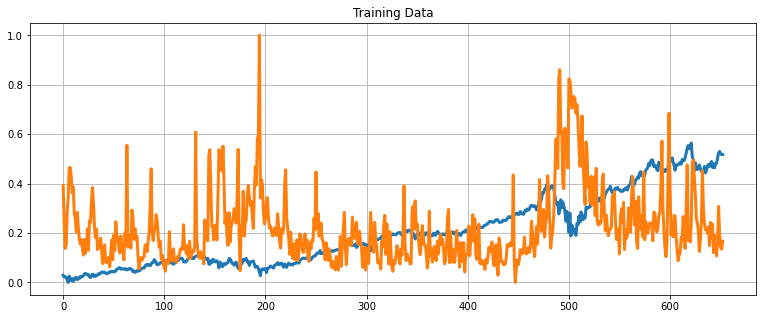

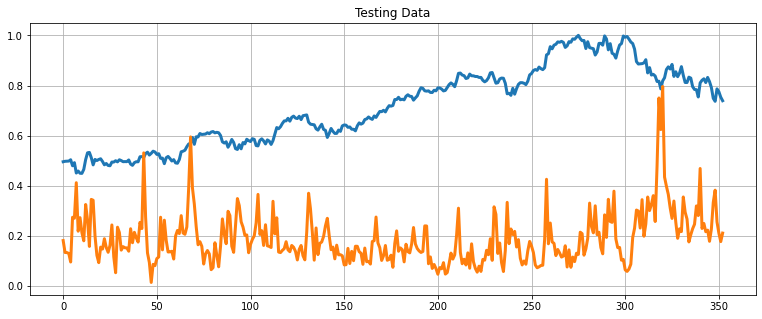

In [47]:
# Define a data plotting function
def show_plot(data, title):
    plt.figure(figsize = (13, 5))
    plt.plot(data, linewidth = 3)
    plt.title(title)
    plt.grid()

show_plot(X_train, 'Training Data')
show_plot(X_test, 'Testing Data')


In [48]:
from sklearn.linear_model import Ridge
# Note that Ridge regression performs linear least squares with L2 regularization.
# Create and train the Ridge Linear Regression  Model
regression_model = Ridge()
regression_model.fit(X_train, y_train)

Ridge()

In [49]:
# Test the model and calculate its accuracy 
lr_accuracy = regression_model.score(X_test, y_test)
print("Linear Regression Score: ", lr_accuracy)

Linear Regression Score:  0.9318866665339595


In [50]:
# Make Prediction
predicted_prices = regression_model.predict(X)
predicted_prices

array([[0.04326418],
       [0.03593371],
       [0.03607773],
       ...,
       [0.73605502],
       [0.71575056],
       [0.70280426]])

In [51]:
# Append the predicted values into a list
Predicted = []
for i in predicted_prices:
    Predicted.append(i[0])

In [52]:
len(Predicted)

1006

In [53]:
# Append the close values to the list
close = []
for i in price_volume_target_scaled_df:
    close.append(i[0])

In [54]:
# Create a dataframe based on the dates in the individual stock data
df_predicted = price_volume_target_df[['Date']]
df_predicted

,Date
0,2018-03-16
1,2018-03-19
2,2018-03-20
3,2018-03-21
4,2018-03-22
...,...
1001,2022-03-08
1002,2022-03-09
1003,2022-03-10
1004,2022-03-11


In [55]:
# Add the close values to the dataframe
df_predicted['Close'] = close
df_predicted

,Date,Close
0,2018-03-16,0.028992
1,2018-03-19,0.022311
2,2018-03-20,0.023249
3,2018-03-21,0.020709
4,2018-03-22,0.010198
...,...,...
1001,2022-03-08,0.737194
1002,2022-03-09,0.786621
1003,2022-03-10,0.775251
1004,2022-03-11,0.753683


In [56]:
# Add the predicted values to the dataframe
df_predicted['Prediction'] = Predicted
df_predicted

,Date,Close,Prediction
0,2018-03-16,0.028992,0.043264
1,2018-03-19,0.022311,0.035934
2,2018-03-20,0.023249,0.036078
3,2018-03-21,0.020709,0.033814
4,2018-03-22,0.010198,0.025041
...,...,...,...
1001,2022-03-08,0.737194,0.701901
1002,2022-03-09,0.786621,0.746955
1003,2022-03-10,0.775251,0.736055
1004,2022-03-11,0.753683,0.715751


In [57]:
# Plot the results
create_plot(df_predicted, "Original Vs. Prediction")

In [58]:
def generate_prediction(price_df, vol_df, name):
    # Get individual stock prices and volumes for the given stock
    price_volume_df = each_ticker(stock_price_df, stock_vol_df, name)
    price_volume_target_df = trading_window(price_volume_df)
    
    # Remove the last row as it will be a null value
    price_volume_target_df = price_volume_target_df[:-1]
    
    # Scale the data
    from sklearn.preprocessing import MinMaxScaler
    sc = MinMaxScaler(feature_range = (0, 1))
    price_volume_target_scaled_df = sc.fit_transform(price_volume_target_df.drop(columns = ['Date']))
    
    # Creating Feature and Target
    X = price_volume_target_scaled_df[:,:2]
    y = price_volume_target_scaled_df[:,2:]
    
    # Spliting the data this way, since order is important in time-series
    # Note that we did not use train test split with it's default settings since it shuffles the data
    split = int(0.65 * len(X))
    X_train = X[:split]
    y_train = y[:split]
    X_test = X[split:]
    y_test = y[split:]
    
    # Define a data plotting function
    def show_plot(data, name, title):
        plt.figure(figsize = (13, 5))
        plt.plot(data, linewidth = 3)
        title = name + title
        plt.title(title)
        plt.grid()

    show_plot(X_train, name, ': Training Data')
    show_plot(X_test, name, ': Testing Data')
    
    from sklearn.linear_model import Ridge
    # Note that Ridge regression performs linear least squares with L2 regularization.
    # Create and train the Ridge Linear Regression  Model
    regression_model = Ridge()
    regression_model.fit(X_train, y_train)
    
    # Test the model and calculate its accuracy 
    lr_accuracy = regression_model.score(X_test, y_test)
    print("Linear Regression Score: ", lr_accuracy)
    
    # Make Prediction
    predicted_prices = regression_model.predict(X)
    predicted_prices

    # Append the predicted values into a list
    Predicted = []
    for i in predicted_prices:
        Predicted.append(i[0])
        
    # Append the close values to the list
    close = []
    for i in price_volume_target_scaled_df:
        close.append(i[0])
        
    # Create a dataframe based on the dates in the individual stock data
    df_predicted = price_volume_target_df[['Date']]
    
    # Add the close values to the dataframe
    df_predicted['Close'] = close

    # Add the predicted values to the dataframe
    df_predicted['Prediction'] = Predicted
    
    # Plot the results
    create_plot(df_predicted, "Original Vs. Prediction", name)
    


Linear Regression Score:  0.662542018872996


Linear Regression Score:  0.7771430773391051


Linear Regression Score:  0.9880968994116734


Linear Regression Score:  0.9409661545024238


Linear Regression Score:  0.9415978876252479


Linear Regression Score:  0.7058573437043001


Linear Regression Score:  0.8870379065888369


Linear Regression Score:  0.9484995611307654


Linear Regression Score:  0.9623626997953932


Linear Regression Score:  0.8919720145693179


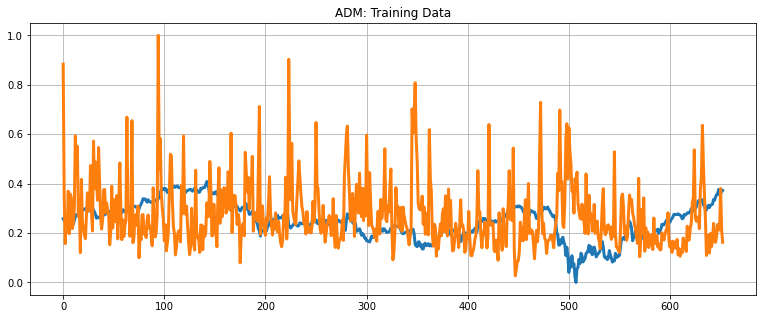

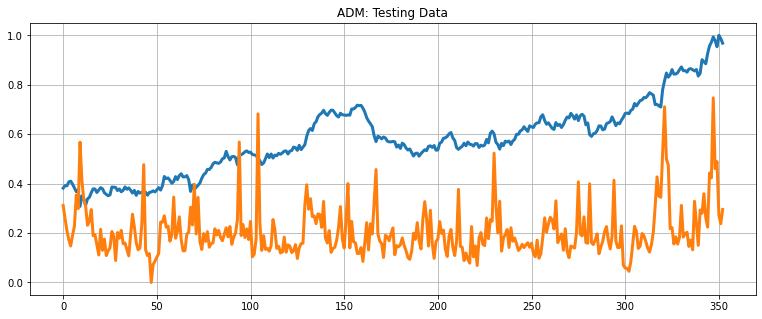

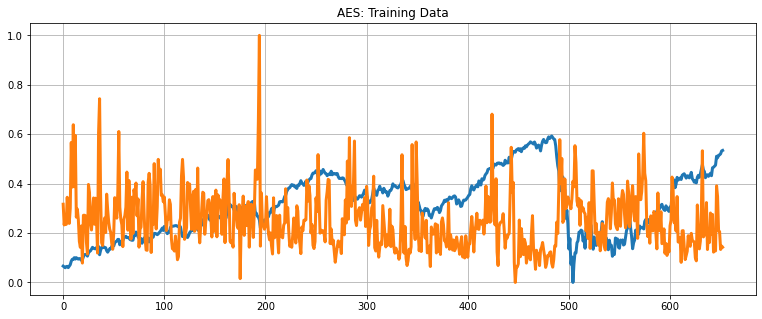

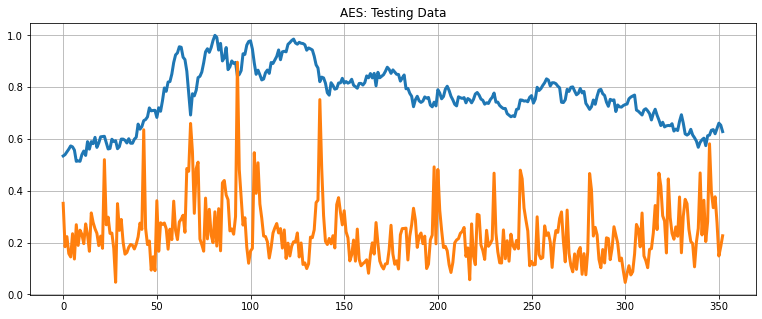

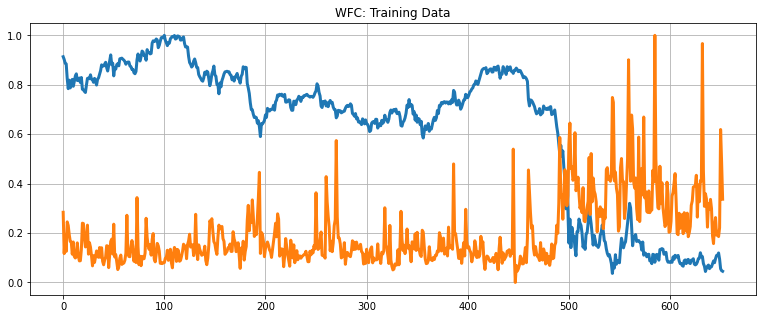

...

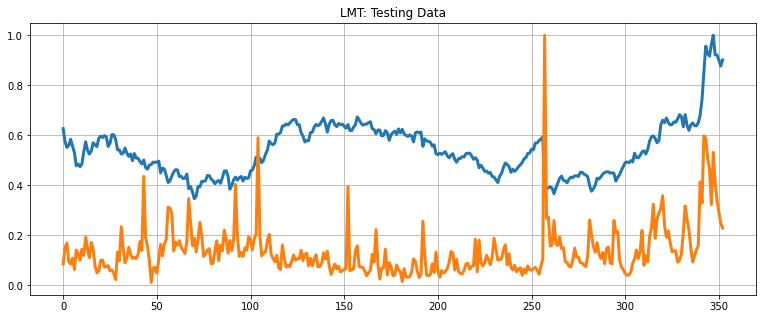

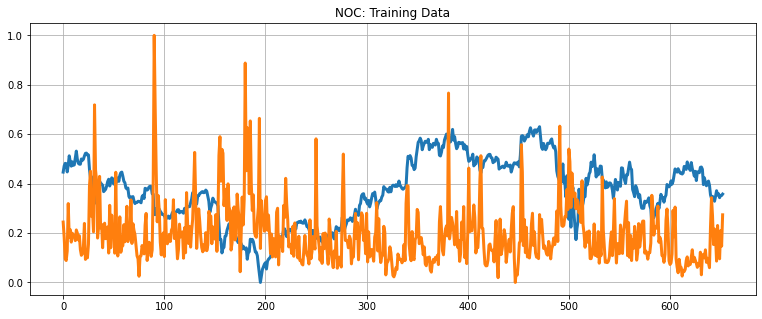

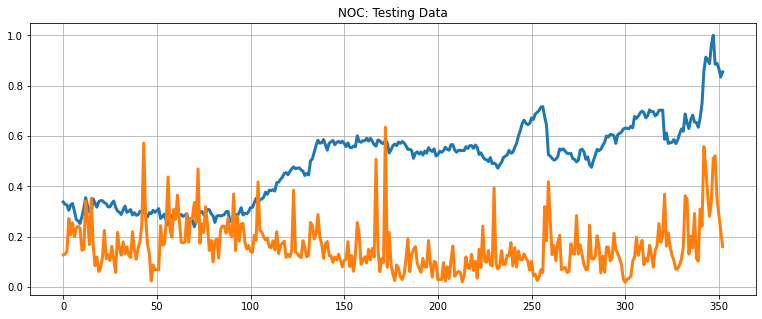

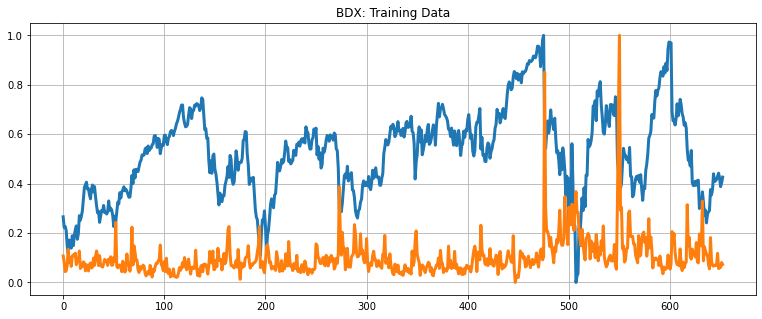

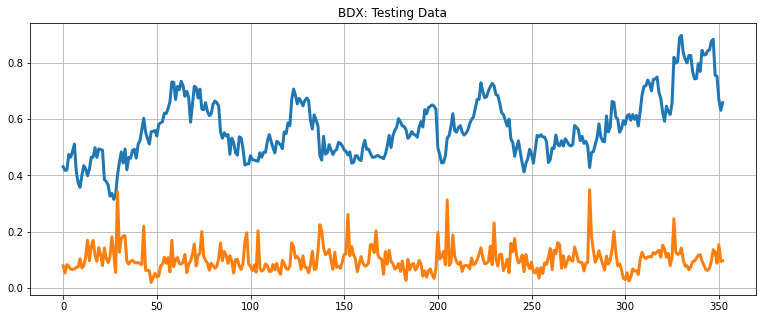

In [60]:
for ticker in top_esg['Ticker']:
    generate_prediction(stock_price_df, stock_vol_df, ticker)